#  **Thin Films Deposition** 


### __Before you start the notebook please run the import section bellow.__

In [2]:
import pandas as pd
import numpy as np
import ipywidgets as widgets
from IPython.display import display, HTML
import plotly.graph_objects as go
from scipy.interpolate import interp1d, CubicSpline
from base64 import b64encode
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, Dropdown, Output, Layout, FloatSlider
import plotly.subplots as sp

HTML("""
<script>
    // Function to suppress JavaScript error messages
    function suppress_js_errors() {
        window.onerror = function(message, source, lineno, colno, error) {
            return true;
        };
    }
    // Call the function to suppress JavaScript error messages
    suppress_js_errors();
</script>
""")


A **thin film** is a layer of material whose thickness spans from fractions of a nanometer to several micrometers. Being a pivotal step in microfabrication processes, thin film deposition enables the assembly of the various materials that constitute the device. Nevertheless, thin film deposition mainly focuses on the application of materials, necessitating the use of other techniques (e.g., etching, lift-off) to sculpt the layer into its desired form.

In this discussion, we will delve into the nuances of depositing a thin film layer onto a substrate. Although numerous techniques can deposit identical materials, each is accompanied by its unique constraints, resulting in layers with distinct properties.

## Physical Vapor Deposition (PVD)

**PVD** comprises a spectrum of vacuum deposition techniques that are employed to produce thin films and coatings on a diverse range of substrates, including metals, ceramics, glass, and polymers. PVD is characterized by a process in which a material undergoes a phase transition: from a condensed phase to a vapor phase, and then back to a thin film condensed phase.

### E-Beam Evaporation

**E-Beam Evaporation** is a method that involves the evaporation of a material (be it grains, pieces, or tablets) situated in a crucible heated by a highly energetic electron beam. the wafers are placed upuside down on a dome at the top of the machine. The crucible is positionned at the bottom along with its heating system and the shutter. During the whole process the chamber is closed and pumped at very low pressures to allow the process to happend and to insure the purity of the deposition.
<br>
The substrat (wafer) is spaced at distance ranging from 10 centimiters to more then a meter depending on the application. This allows for very good film uniformities.
This type of process allow for the use of quartz resonators to measure the thickness which have a precision in the order of the tenth of angstrom. 

<img src="inside_evaporator.png" width="400" height="400">

__Here is the inside of an evaporation machine__ (Try to add other images from the CMI)



In [2]:
mp4 = open('evaporation_clip.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1000 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

_Clip description:_ This clip shows an evaporation machine mainly used in the context of lift-off processes with its large crucible to wafer distance. From 0 to 5 seconds: the outside of the chamber which constitutes the vaccum chamber. From 5 to 11 seconds: the wafer holders at the top of the machine. From 12 seconds til the end: the materials (the crucibles) which are installed at the bottom next to an electron beam gun, multiple materials are installed to allow for multi-layer deposition without having to pump back the chamber.

### Sputtering

**Sputtering** is a process initiated by a plasma; the ions generated are accelerated towards the target's surface (a block of material intended for deposition onto your substrate). Some atoms are ejected from the surface due to ion bombardment, and these sputtered atoms redeposit onto the sample surfaces to form a thin film. The three primary types of sputtering are DC Sputtering, RF Sputtering, and Magnetron Sputtering, each differing by the material that can be sputtered and the effects on the machine's wear.
<br>
The substrat is often placed at ranges from 2 to 15 centimeters from the target.
<br>
As there is a plasma inside the chamber there aren't any suitable sensors which can be used. The deposition rate is constant for constant parameters, so the thickness is defined by the process duration.

![Image of a target](image_link)



In [3]:
mp4 = open('sputtering_clip.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1000 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Comparison of PVD techniques

The following table from the [pdv course](final_files_dril/MICRO-331_Week3_PVD.pdf)
 provides a good comparison of the diffrent PVD techniques. Keep in mind that IAD, MBE and PLD aren't explained here as they are less common techniques which are used in specific processes.

<img src="pvd_comparison.jpg" width="70%" height="400">

## Chemical Vapor Deposition (CVD)

CVD involves exposing the wafer (substrate) to one or more volatile precursors, which react and/or decompose on the substrate's surface to yield the desired deposit. Volatile by-products are often generated, which are then removed by gas flow through the reaction chamber. The principal difference between CVD and PVD is the nature of the deposition: in PVD, the deposition is achieved through physical means, whereas in CVD, a surface reaction induces the deposition.

Consequently, both methods yield differing deposition profiles.

<img src="cvd_profile.png" width="400" height="400">

__Cross section of a cvd deposition__

# *Exercice Section*
* # Film selection

_Your first task is to select the material you will use for your layer. It has to optimized the parameters of design that you found in the first notebook._
<br>
_This task is essential to any micro-fabrication design as this will constitute the active layer(s) the device._

You have access to some information about materials which can be deposited with PVD. With the first table, find the material you want to use for your active layer. 
<br>
Based on its proprieties then you can select an adhesion layer using the second table. It can be crucial as many material have a very poor adhesion on Silicon or Silica.

In [4]:
# Define the data for the table
data = {
    'Material': ['Pt', 'Au', 'Ti', 'Cu', 'Al'],
    'Electrical Conductivity (MS/m)': [9.43, 45.2, 2.3, 59.6, 37.8],
    'Price (CHF/g)': [35, 60, 0.5, 0.05, 0.03],
    'Usual Roughness (nm)': [1, 1, 2, 1, 2],
    'Deposition Rate Range - Evaporation (nm/min)': ['5-50', '10-100', '1-10', '20-200', '10-100'],
    'Deposition Rate Range - Sputtering (nm/min)': ['1-10', '5-50', '0.1-1', '5-50', '1-10'],
    'Adhesion Layer Required': ['Yes', 'Yes', 'No', 'No', 'Yes']
}

# Create a DataFrame
materials_df = pd.DataFrame(data)

# Create a dropdown widget for selecting the material
material_dropdown_pvd = widgets.Dropdown(
    options=['Pt', 'Au', 'Ti', 'Cu', 'Al'],
    value='Pt',
    description='Material:',
    disabled=False,
)

# Create a button to display the selected material's properties
display_properties_button = widgets.Button(description="Display Properties")

# Define a function to handle button clicks
def on_display_properties_button_click(button):
    display_material_properties(material_dropdown_pvd.value)

display_properties_button.on_click(on_display_properties_button_click)

# Create an Output widget to display the material properties
output_widget = widgets.Output()

def display_material_properties(material):
    # Clear the previous output
    output_widget.clear_output()
    
    selected_material = materials_df[materials_df['Material'] == material]
    
    # Create a Plotly table
    table = go.Figure(data=[go.Table(
        header=dict(values=list(selected_material.columns),
                    fill_color='paleturquoise',
                    align='left'),
        cells=dict(values=[selected_material[col] for col in selected_material.columns],
                   fill_color='lavender',
                   align='left'))
    ])
    
    # Display the properties of the selected material within the Output widget
    with output_widget:
        display(table.show())

In [5]:
# Display the widgets and the Output widget
display(material_dropdown_pvd)
display(display_properties_button)
display(output_widget)

Dropdown(description='Material:', options=('Pt', 'Au', 'Ti', 'Cu', 'Al'), value='Pt')

Button(description='Display Properties', style=ButtonStyle())

Output()

In [6]:
# Define the data for the adhesion layers table
adhesion_data = {
    'Adhesion Layer': ['Ti', 'Cr', 'Ta', 'Ni'],
    'Price (USD/g)': [0.5, 0.02, 2, 0.03],
    'Deposition Rate Range - Evaporation (nm/min)': ['1-10', '5-50', '1-10', '5-50'],
    'Deposition Rate Range - Sputtering (nm/min)': ['0.1-1', '1-10', '0.1-1', '1-10'],
    'Typical Thickness (nm)': [1, 1, 1, 1],
    'Commonly Used With': ['Au, Pt, Al', 'Au, Al', 'Pt, Refractory Metals', 'Au, Ag, Cu'],
}

# Create a DataFrame
adhesion_layers_df = pd.DataFrame(adhesion_data)

# Create a dropdown widget for selecting the material
material_dropdown_adhesion = widgets.Dropdown(
    options=['Ti', 'Cr', 'Ta', 'Ni'],
    value='Ti',
    description='Adhesion layer materials:',
    disabled=False,
)

# Create a button to display the selected material's properties
display_properties_button_adh = widgets.Button(description="Display Properties")

# Define a function to handle button clicks
def on_display_properties_button_click_adh(button):
    display_material_properties_adh(material_dropdown_adhesion.value)

display_properties_button_adh.on_click(on_display_properties_button_click_adh)

# Create an Output widget to display the material properties
output_widget = widgets.Output()

def display_material_properties_adh(material):
    # Clear the previous output
    output_widget.clear_output()
    
    selected_material = adhesion_layers_df[adhesion_layers_df['Adhesion Layer'] == material]
    
    # Create a Plotly table
    table = go.Figure(data=[go.Table(
        header=dict(values=list(selected_material.columns),
                    fill_color='paleturquoise',
                    align='left'),
        cells=dict(values=[selected_material[col] for col in selected_material.columns],
                   fill_color='lavender',
                   align='left'))
    ])
    
    # Display the properties of the selected material within the Output widget
    with output_widget:
        display(table.show())

In [7]:
# Display the widgets and the Output widget
display(material_dropdown_adhesion)
display(display_properties_button_adh)
display(output_widget)

Dropdown(description='Adhesion layer materials:', options=('Ti', 'Cr', 'Ta', 'Ni'), value='Ti')

Button(description='Display Properties', style=ButtonStyle())

Output()

<span style='background :yellow' >
TODO: add more data about the materials. Fix the top cell so it shows well or make the two widgets in one cell

### Selected parameters materials for the layer
_Please enter the materials you will use for your metal layer and its thickness. Concerning the adhesion layer concider that the previous data concerns the adhesion layer need in case of an SiO2 under layer. However keep in mind that it is very often needed for many materials and you need to look at the specific case of your application._

In [8]:
metal_layer = 'Ti' #as a string
metal_thickness = 0 # [nm]
adhesion_layer = 'Ti' #as a string if no adhesion choosen use None
adhesion_thickness = 0 #[nm]

* # Pumping step


The pumping is a key step in many deposition. Indeed the processes need to happend at very low pressure both for the process to be stable and also for garanting the purity of the final film.
In many machines there exist some load lock mechanism where the machine is split between multiple chambers with the usual configuration being: load lock <-> transfer module <-> process chamber.
<br>
The load lock is a small chamber which only serves as an hosting chamber for the wafers. With its small volume it is very fast to pump.
The transfer module hosts a robotic arm which transfers the wafer into the chamber. 
The process chamber hosts the process. It contains the material which will be deposited and the wafer during the process. It is only vented when the materials are changed.
<br>
Usually there are multiple process chambers they can also be used for other processes than thin film deposition (dry etching, plasma cleaning...).
<br>

However in many cases the machine is made of a single chamber. In this case the pumping step can be very limiting as it often represents most of the time of the process.
<br>

It is the case most evaporators. Unfortunately the larger the chamber, the larger the mean free path.
As an order of magnitude the mean free path needs to be at least 100 order of magnitude larger than the travel path from the crucible to the wafer in evaporation.
<br>
However the pumping time growth explodes as you reach very low pressures. Thus, a comprime has to be found.


- **λ (l)**: mean free path in [m]
- **R**: gas constant in [J/(mol·K)]
- **T**: temperature in [K]
- **M**: molar mass in [kg/mol]
- **η (h)**: gas viscosity in [Pa·s]
- **P**: reactor pressure in [Pa]

The mean free path, λ (l), can be calculated with the following equation:

## $ \lambda = \sqrt{\frac{\pi R T}{2 M}}\frac{\eta}{P} \text{ in }   [m]$



TODO: add more data for the pumping time, maybe plot the curve?

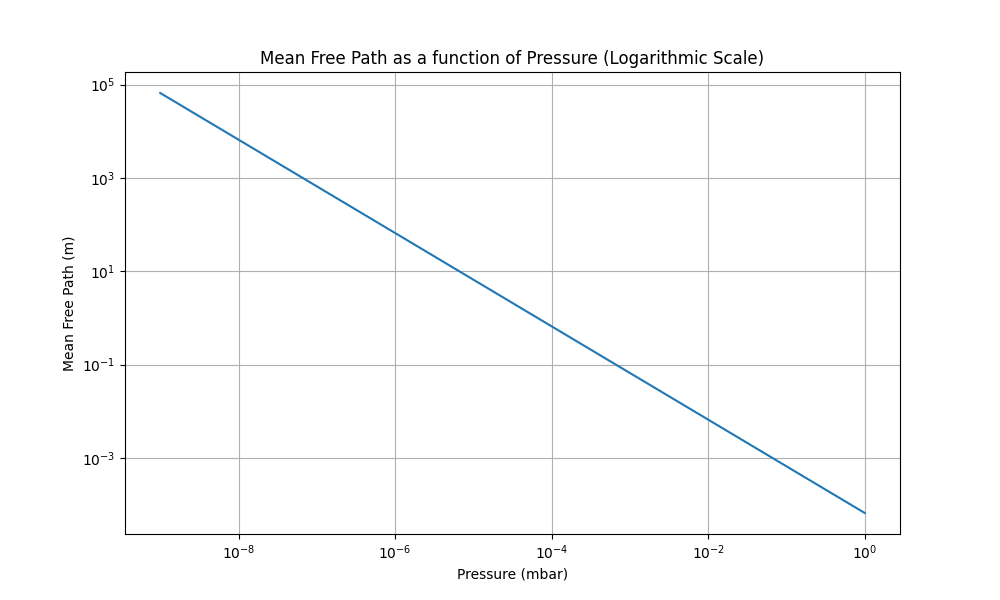

In [9]:
%matplotlib widget

# Constants
R = 8.314    # ideal gas constant, J/(mol*K)
T = 298.15   # absolute temperature, K
M = 0.02897  # molar mass of air, kg/mol
eta = 1.8e-5 # dynamic viscosity of air at room temperature, Pa*s
pi = np.pi   # pi constant

# Pressure range in millibars
P_mbar = np.logspace(-9, 0, 1000) # from 1 atmosphere to 10 atmospheres
P_pa = P_mbar * 100  # convert from mbar to Pa

# Mean free path calculation
lambda_ = np.sqrt(pi * R * T / (2 * M)) * eta / P_pa

# Plot
plt.figure(figsize=(10, 6))
plt.loglog(P_mbar, lambda_)
plt.xlabel('Pressure (mbar)')
plt.ylabel('Mean Free Path (m)')
plt.title('Mean Free Path as a function of Pressure (Logarithmic Scale)')
plt.grid(True)
plt.show()

### Selected pressure for the process
_Please enter the desired pressure you want for the process._

In [10]:
P = 10e-8 #[mBar]

* # Evaporation

In the following section you will explore the different parameters as well as model approximations of evaporations. 
DONNER UN CONTEXT DE PRODUCTION?
<br>
Here are the following parameters you havea access to:
<br>
* __Distance__ : it is the distance between the crucible and the wafer. It is the most significant parameter (when you have the right pressure and a stable evaporation) in an evaporation process. 
* __Wafer size__: 5, 10 or 16 cm of diameters. Larger wafers allow for better scalability of the process but lead to less uniform processes (also the case for other steps than thin film deposition). Smaller wafer are mainly used for research where even chips of 10 by 10 mm squares are used. Allowing for a reduced price while insuring uniform processes.
* __Source approximation__: The source can be approximated to be a point or a surface. When the source is assumed to be a point all evaporation is assumued to come from it while surface evaporation assumes the evaporated material can come from all of the sruface of the crucible. In practice the evaporation comes from a surface which size depends on the material and the power used to the evaporation.
* __Directionnality__: The evaporation flux can either be assumed to be a sphere or a directional flux. In pratice it is more often directional.
<br>

_Keep in mind this is a simple model which reflects the main effects but doesn't represents a perfect reality as it doesn't take into account thermal effects, growth of the material or roughness which are a lot more advanced and epirical. The parameters of the electron beam gun or the heating system aren't talked about as they aren't relevant to the study of evaporation in the context of microfabrication._
<br>

The following code allows you to simulate the profile of the evaporated surface. It is mainly here to help you understand the influence of each of these parameters. On the left you have a 3d surface of the wafer and on the right a 2d surface where you can access the exact thickness deposited as a function of the distance of the points from the center of the wafer. For both plot, mind the scale. The aspect ratio can be activated and deactivated for the left figure.

__The plot might take a few seconds to update when you change the parameters__

In [11]:
%matplotlib widget

output_widget = Output(layout={'width': '100%', 'height': '100%'})

def calculate_thickness(X, Y, distance, wafer_size, evaporation_type, directionality):
    if evaporation_type == 'point':
        R = np.sqrt((X - wafer_size / 2) ** 2 + (Y - wafer_size / 2) ** 2 + distance ** 2)
        theta = np.arccos(distance / R)
        if directionality == 'uniform':
            Z = np.cos(theta) ** 2
        elif directionality == 'non-uniform':
            Z = np.cos(theta)
    else:  # evaporation_type == 'surface'
        R = np.sqrt((X - wafer_size / 2) ** 2 + (Y - wafer_size / 2) ** 2 + distance ** 2)
        theta = np.arccos(distance / R)
        if directionality == 'uniform':
            Z = np.cos(theta) ** 2
        elif directionality == 'non-uniform':
            Z = np.cos(theta)
    
    return Z*100


# Precompute 3D shapes
def precompute_shapes():
    shapes = {}
    wafer_sizes = [5, 10, 16]
    evaporation_types = ['point', 'surface']
    directionalities = ['uniform', 'non-uniform']
    distance_values = range(5, 201, 5)

    for distance in distance_values:
        for wafer_size in wafer_sizes:
            x = np.linspace(0, wafer_size, 50)
            y = np.linspace(0, wafer_size, 50)
            X, Y = np.meshgrid(x, y)
            for evaporation_type in evaporation_types:
                for directionality in directionalities:
                    Z = calculate_thickness(X, Y, distance, wafer_size, evaporation_type, directionality)

                    # Circular mask for the wafer
                    mask = np.sqrt((X - wafer_size / 2) ** 2 + (Y - wafer_size / 2) ** 2) > wafer_size / 2
                    Z[mask] = np.nan

                    shapes[(distance, wafer_size, evaporation_type, directionality)] = (X, Y, Z)
    return shapes

precomputed_shapes = precompute_shapes()

def update_square_color(trace, points, selector):
    clicked_square_index = points.point_inds[0]
    current_color = trace.marker.color[clicked_square_index]
    new_color = 'red' if current_color != 'red' else 'green'
    trace.marker.color[clicked_square_index] = new_color
    trace.marker.colorbar.update()
    trace.update()
    
    


@output_widget.capture(clear_output=True)
def plot_thickness(distance, wafer_size, evaporation_type, directionality, aspect_ratio):
    X, Y, Z = precomputed_shapes[(distance, wafer_size, evaporation_type, directionality)]

    fig = sp.make_subplots(rows=1, cols=2, specs=[[{'type': 'surface'}, {'type': 'xy'}]])

    # Add colorbar_title to go.Surface trace
    fig.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale='Viridis', showscale=False, 
                             colorbar_title="(nm)"), row=1, col=1)
    hover_text = np.empty_like(Z, dtype=object)
    for i in range(Z.shape[0]):
        for j in range(Z.shape[1]):
            R = np.sqrt((X[i, j]- wafer_size/2) ** 2 + (Y[i, j]-wafer_size/2) ** 2)
            hover_text[i, j] = f"distance from the center of the wafer: {R:.2f} cm<br>layer thickness: {Z[i, j]:.2f} nm"
    heatmap = go.Heatmap(z=Z, x=X[0], y=Y[:, 0],text=hover_text, showscale=False, hoverinfo='text',colorscale='Viridis')
    fig.add_trace(heatmap, row=1, col=2)
    fig.update_xaxes(visible=False, showticklabels=False, row=1, col=2)
    fig.update_yaxes(visible=False, showticklabels=False, row=1, col=2)


    fig.update_layout(title=f'Thin Film Thickness Uniformity for 100nm evaporation at the center point <br> for a wafer of {wafer_size} cm of diameter',
                      height=600, margin=dict(l=10, r=10, t=80, b=10))
    z_min = 0
    z_min = {5: 97, 10: 95}.get(wafer_size, 85 if distance < 50 else 95)
    if aspect_ratio == 'no':
        z_min = 0
    fig.update_layout(scene=dict(zaxis=dict(range=[z_min, 100])))

    # Add click event handler to the heatmap
    fig.data[1].on_click(update_square_color)
    fig.show()

style = {'description_width': 'initial'} 
    
display(output_widget)

distance_widget = IntSlider(min=5, max=100, step=5, value=50 , description='Distance (cm)   ', style=style)
wafer_size_widget = Dropdown(options=[5, 10, 16], value=5, description='Wafer diameter (cm) ', style=style)
evaporation_type_widget = Dropdown(options=['point', 'surface'], value='point', description='Evaporation Type', style=style)
directionality_widget = Dropdown(options=['uniform', 'non-uniform'], value='uniform', description='Directionality   ', style=style)
aspect_ratio_widget = Dropdown(options=['yes','no'], value='yes', description='Aspect ratio',style=style)
interact(plot_thickness, distance=distance_widget, wafer_size=wafer_size_widget, evaporation_type=evaporation_type_widget, directionality=directionality_widget,aspect_ratio=aspect_ratio_widget);


Output(layout=Layout(height='100%', width='100%'))

interactive(children=(IntSlider(value=50, description='Distance (cm)   ', min=5, step=5, style=SliderStyle(des…

* # Evaporation on a slopped profile
__This last section illustrates the effect of structures in an evaporation. In the last situation the profile of the wafer was assumed to be flat or with plannar structures which is often the case in micro electronics.__
<br>

In many advanced micro-engineering cases you will have slopped structures. As you are interested in the normal thickness of deposition which defines most of the proprieties of the layer, this next module focuses on the impact 
of a slope on the evaporation. On another level it shows the crucial role of having a good structure shape when you perform lift off as any slope would result in material deposition which would block the lift off process.

In this exercice you can select which representation model you wish to use. You can change the value of the model variable to experiment other models. There are three possible models: 'course', 'Thornton' and the 'power law

In [4]:
import numpy as np
import plotly.graph_objs as go
from ipywidgets import interact, FloatSlider, Label
from scipy.ndimage import gaussian_filter1d

model = 'course'

def update_thickness_display(alpha, model, initial_thickness=1):
    alpha_rad = np.radians(alpha)
    t1 = initial_thickness*100
    t2 = slope_thickness(t1,alpha,model)
    thickness_display.value = f'Thickness on flat surfaces: {t1:.2f} nm and the thickness on slopes: {t2:.2f} nm'

    

def slope_thickness(t1,alpha,model): 
    t2 = 0
    alpha_rad = np.radians(alpha)
    if model == 'course':
        t2 = np.cos(alpha_rad) * t1
    elif model == 'Thornton': 
        critical_angle = np.radians(80)  # You can adjust this value based on the specific material
        if alpha <= critical_angle:
            t2 = t1 * (1 - (alpha_rad / critical_angle))
        else:
            t2 = 0
    else:
        k = 0.01
        t2 = t1 * np.exp(-alpha_rad * k)
    
    return t2

def create_cross_section(alpha,model, distance_from_source=50, initial_thickness=1):
    alpha = np.radians(alpha)
    step = 0.2
    
    t1 = initial_thickness
    t2 = slope_thickness(t1,alpha,model)

    
    x1 = np.linspace(0, 1.5, 50)
    y1 = np.zeros_like(x1) + step

    x2 = np.linspace(1.5, 3 , 50)
    y2 = np.linspace(0, 2 * np.sin(alpha), 50) + step

    x3 = np.linspace(3 + np.cos(alpha), 6, 50)
    y3 = np.ones_like(x3) * 2 * np.sin(alpha) + step

    x = np.concatenate((x1, x2, x3))
    y = np.concatenate((y1, y2, y3))

    y_top = np.zeros_like(y)

    if alpha == 0:
        y_top_smooth = y + t1
    else:
    # Create the top layer
        for i in range(len(x)):
            y1_line = y1[0] + t1
            y2_line = ((x[i] - x2[0]) * (y2[-1] - y2[0]) / (x2[-1] - x2[0])) + y2[0] + t2
            y3_line = y3[0] + t1
         
            #left of the image
            if y1_line >= y2_line:
                y_top[i] = y1_line
            elif y2_line <= y3_line:
                y_top[i] = y2_line
            else:
                y_top[i] = y3_line

        #y_top_smooth = gaussian_filter1d(y_top, sigma=1)


    return x, y, y_top

   

def plot_cross_section(alpha):
    x, y, y_deposition = create_cross_section(alpha,model)
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=x, y=y, fill='tozeroy', fillcolor='rgba(0,100,80,1)', mode='none', name='Structure'))
    fig.add_trace(go.Scatter(x=x, y=y_deposition, fill='tozeroy',fillcolor='rgba(100,0,0,0.1)', mode='none', name='Deposited layer'))

    max_x = np.max(x)
    max_y = np.max(y)
    lim_y = 6
    fig.update_layout(
        title=f'Cross-section with angle {alpha} degrees',
        xaxis=dict(
            range=[0, max_x],
            constrain='domain',
            showticklabels=False,
            showgrid=False,
            zeroline=False
        ),
        yaxis=dict(
            range=[0, lim_y],
            scaleanchor='x',
            scaleratio=max_y / max_x,
            constrain='domain',
            showgrid=False,
            zeroline=False
        ),
        plot_bgcolor='white',
        margin=dict(l=20, r=20, t=80, b=20),
        autosize=False,
        width=1800,
        height=650
    )

    fig.show()
    update_thickness_display(alpha_slider.value, model)

thickness_display = Label()
display(thickness_display)
style = {'description_width': 'initial'} 
alpha_slider = FloatSlider(min=0, max=80, step=1, value=30, description='Angle (degrees)',style=style)
interact(plot_cross_section, alpha=alpha_slider);

Label(value='')

interactive(children=(FloatSlider(value=30.0, description='Angle (degrees)', max=80.0, step=1.0, style=SliderS…

_In green you have the under structure which is present before the evaporation. In pink you have the evaporated layer_

## __This is the end of the thin film section.__
## __Please go back to the main notebook and fill the required data from what you found here.__